In [1]:
'''Adapted from https://github.com/FunctionLab/ExPecto/blob/master/chromatin.py'''

import argparse
import torch
import numpy as np
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import pickle
from torch import nn
import torch.nn.functional as F


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import torch
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, dim, dropout=0.3):
        super().__init__()
        self.block = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim, dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        return x + self.block(x)



class ExpressionPredictor(nn.Module):
    def __init__(self, base_model, hidden_dim=2048, output_dim=218, num_blocks=6):
        super().__init__()
        self.base_model = base_model

        # Freeze the base model
        for param in self.base_model.parameters():
            param.requires_grad = False

        self.input_proj = nn.Linear(base_model.config.hidden_size, hidden_dim)

        # Stack of residual blocks
        self.res_blocks = nn.Sequential(*[
            ResidualBlock(hidden_dim, dropout=0.3) for _ in range(num_blocks)
        ])

        # Final output layer
        self.output_layer = nn.Linear(hidden_dim, output_dim)

    def forward(self, input_ids, attention_mask=None):
        with torch.no_grad():
            outputs = self.base_model(input_ids=input_ids, attention_mask=attention_mask)
            cls_embedding = outputs.last_hidden_state[:, 0]

        x = self.input_proj(cls_embedding.float())
        x = self.res_blocks(x)
        out = self.output_layer(x)
        return out


In [4]:
# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load tokenizer and model
model_name = "InstaDeepAI/nucleotide-transformer-2.5b-multi-species"
tokenizer = AutoTokenizer.from_pretrained(model_name)
base_model = AutoModel.from_pretrained(model_name, torch_dtype=torch.float16).to(device)
max_length = tokenizer.model_max_length


# Load downstream model
output_dim = 218
model = ExpressionPredictor(base_model, output_dim).to(device)

# Load each component of the saved downstream model
checkpoint = torch.load("/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/model_weights/downstream_weights.pt")
model.input_proj.load_state_dict(checkpoint['input_proj'])
model.res_blocks.load_state_dict(checkpoint['res_blocks'])
model.output_layer.load_state_dict(checkpoint['output_layer'])

model.eval()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/129 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/28.7k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/101 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/707 [00:00<?, ?B/s]

pytorch_model.bin.index.json:   0%|          | 0.00/46.0k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

pytorch_model-00001-of-00002.bin:   0%|          | 0.00/9.91G [00:00<?, ?B/s]

pytorch_model-00002-of-00002.bin:   0%|          | 0.00/278M [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/48.1k [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of EsmModel were not initialized from the model checkpoint at InstaDeepAI/nucleotide-transformer-2.5b-multi-species and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ExpressionPredictor(
  (base_model): EsmModel(
    (embeddings): EsmEmbeddings(
      (word_embeddings): Embedding(4105, 2560, padding_idx=1)
      (dropout): Dropout(p=0.0, inplace=False)
      (position_embeddings): Embedding(1002, 2560, padding_idx=1)
    )
    (encoder): EsmEncoder(
      (layer): ModuleList(
        (0-31): 32 x EsmLayer(
          (attention): EsmAttention(
            (self): EsmSelfAttention(
              (query): Linear(in_features=2560, out_features=2560, bias=True)
              (key): Linear(in_features=2560, out_features=2560, bias=True)
              (value): Linear(in_features=2560, out_features=2560, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): EsmSelfOutput(
              (dense): Linear(in_features=2560, out_features=2560, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (LayerNorm): LayerNorm((2560,), eps=1e-12, elementwise_affine=True)
          )
  

In [ ]:
# # Device setup
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Load tokenizer and model
# model_name = "InstaDeepAI/nucleotide-transformer-2.5b-multi-species"
# tokenizer = AutoTokenizer.from_pretrained(model_name)
# base_model = AutoModel.from_pretrained(model_name, torch_dtype=torch.float16).to(device)
# max_length = tokenizer.model_max_length

# # Load downstream model
# model_path= "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/model_weights/mlp_weights.pt"
# output_dim = 218 # number of human tissues
# model = ExpressionPredictor(base_model, output_dim).to(device)
# model.mlp.load_state_dict(torch.load(model_path))
# max_length = tokenizer.model_max_length
# model.eval()


In [ ]:
def extract_seqs_from_pickle(file_path):
    """
    Extracts lists from a pickle file.

    Args:
        file_path (str): The path to the pickle file.

    Returns:
        list or None: A list containing the extracted lists, or None if an error occurs.
    """
    try:
        with open(file_path, 'rb') as file:
            data = pickle.load(file)
            if isinstance(data, list):
                return data
            elif isinstance(data, dict):
              list_values = [value for value in data.values() if isinstance(value, list)]
              return list_values
            else:
                print("The pickle file does not contain a list or a dictionary with list values at the top level.")
                return None
    except FileNotFoundError:
        print(f"Error: The file '{file_path}' was not found.")
        return None
    except pickle.UnpicklingError:
        print(f"Error: Unable to unpickle the data from '{file_path}'. The file may be corrupted or not a pickle file.")
        return None
    except Exception as e:
         print(f"An unexpected error occurred: {e}")
         return None


In [ ]:
refseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/crohns_seqs/refseqs_human.shift_0"
altseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/crohns_seqs/altseqs_human.shift_0"

refseqs  = extract_seqs_from_pickle(refseqs_filepath)
altseqs  = extract_seqs_from_pickle(altseqs_filepath)

print(len(refseqs))
print(len(altseqs))

13
13


In [ ]:
# get gene expression value differences
ref_tokenized = tokenizer(refseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
ref_input_ids = ref_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
ref_attention_mask = (ref_input_ids != tokenizer.pad_token_id).long().to(device)
alt_tokenized = tokenizer(altseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
alt_input_ids = alt_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
alt_attention_mask = (alt_input_ids != tokenizer.pad_token_id).long().to(device)
# get model predictons for both
ref_preds = model(ref_input_ids, ref_attention_mask).float()
alt_preds = model(alt_input_ids, alt_attention_mask).float()
diff = alt_preds - ref_preds

In [ ]:
print(diff.shape)

torch.Size([13, 218])


In [ ]:
# import numpy as np
# diff = alt_preds - ref_preds
# all_diff.append(diff.cpu().detach().numpy())
# print(np.array(all_diff).shape)


In [ ]:
num_variants = len(diff)
num_variants

13

In [ ]:
# Calculate the mean difference across all 218 tissues for each variant
mean_diff_across_tissues = torch.mean(diff, dim=-1)  # Shape: (1, 13)

# Calculate the standard deviation of the expression difference across all 218 tissues for each variant
std_diff_across_tissues = torch.std(diff, dim=-1)  # Shape: (1, 13)

print(f"Mean Expression Difference Across Tissues (per variant): {mean_diff_across_tissues}")
print(f"Standard Deviation of Expression Difference Across Tissues (per variant): {std_diff_across_tissues}")

Mean Expression Difference Across Tissues (per variant): tensor([-0.4224, -0.0443, -0.0977, -0.2159, -0.0363,  0.0543,  0.2013,  0.1867,
         0.1589, -0.0644, -0.5351, -0.0990,  0.0189], device='cuda:0',
       grad_fn=<MeanBackward1>)
Standard Deviation of Expression Difference Across Tissues (per variant): tensor([0.0970, 0.0098, 0.0211, 0.0425, 0.0120, 0.0120, 0.0398, 0.0496, 0.0319,
        0.0160, 0.1046, 0.0187, 0.0056], device='cuda:0',
       grad_fn=<StdBackward0>)


In [ ]:
# get tissue labels
n_tissues = 218
human_exp = pd.read_csv('/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/human/sequence_exp_6000.csv')
tissue_start = human_exp.columns.get_loc('Adipose_Subcutaneous')
expression_vals = human_exp.iloc[:, tissue_start : tissue_start + n_tissues]
tissues = list(expression_vals.columns)

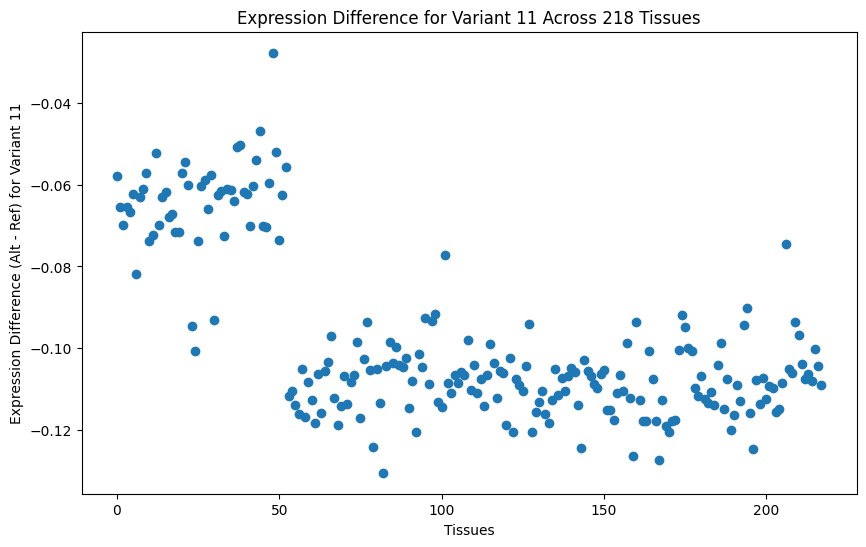

In [ ]:
import matplotlib.pyplot as plt

# Visualizing the expression difference for the first variant (0-th index)
plt.figure(figsize=(10, 6))
variant_exp_diff = diff[2, :].cpu().detach().numpy()
plt.scatter(range(218), variant_exp_diff)  # For the first variant
# for i, label in enumerate(tissues):
#   if i in [45,193,194,205]:
#     plt.text(range(218)[i], variant_exp_diff[i], label, ha = 'center', va = 'bottom')
plt.xlabel("Tissues")
plt.ylabel("Expression Difference (Alt - Ref) for Variant 11")
plt.title("Expression Difference for Variant 11 Across 218 Tissues")
plt.show()

In [ ]:
from scipy.stats import ttest_rel

# Example data: Assuming ref_preds and alt_preds have shape (1, 13, 218)
# ref_preds and alt_preds are numpy arrays or PyTorch tensors with shape (1, 13, 218)

# Initialize lists to store t-statistics and p-values for each variant
t_stat = np.zeros((num_variants,))  # Shape (13,), t-statistic for each variant
p_value = np.zeros((num_variants,))  # Shape (13,), p-value for each variant

# Loop through each variant (index 0 to 12)
for variant_idx in range(num_variants):
    # Extract reference and alternative predictions for the current variant across all 218 tissues
    ref_pred = ref_preds[variant_idx, :].cpu().detach().numpy()  # Ref predictions for the current variant
    alt_pred = alt_preds[variant_idx, :].cpu().detach().numpy()  # Alt predictions for the current variant

    # Perform a paired t-test between ref_pred and alt_pred for the current variant across all tissues
    t_stat[variant_idx], p_value[variant_idx] = ttest_rel(ref_pred, alt_pred)

# Now t_stat contains the t-statistics for each variant, and p_value contains the p-values
print("T-statistics for each variant:")
print(t_stat)

print("P-values for each variant:")
print(p_value)


T-statistics for each variant:
[ 64.31822313  66.65676258  68.41874     74.91302627  44.72595744
 -66.71197992 -74.72323726 -55.55699459 -73.44471433  59.33352437
  75.53676638  78.28816621 -50.1167338 ]
P-values for each variant:
[2.70703121e-143 1.69130882e-146 7.59641079e-149 4.79301488e-157
 1.72552571e-111 1.42495503e-146 8.14308295e-157 2.77879481e-130
 2.98983962e-155 4.23947073e-136 8.47050963e-158 4.73199335e-161
 2.85716282e-121]


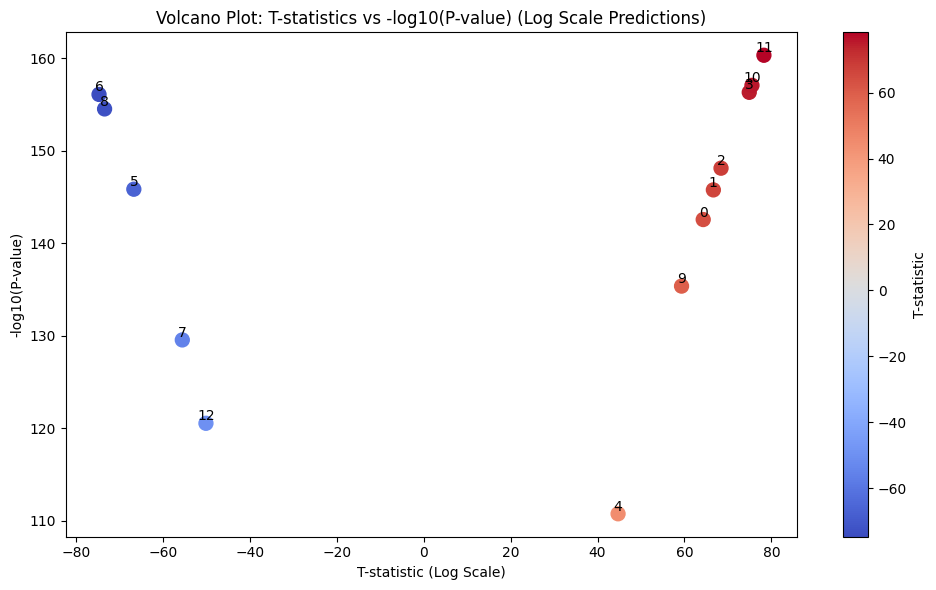

In [ ]:
# Volcano plot (T-statistics vs -log10(P-values))
log_p_values = -np.log10(p_value)
plt.figure(figsize=(10, 6))
plt.scatter(t_stat, log_p_values, c=t_stat, cmap='coolwarm', s=100)
labels = ['{}'.format(i) for i in range(num_variants)]
for i, label in enumerate(labels):
    plt.text(t_stat[i], log_p_values[i], label, ha = 'center', va = 'bottom')
plt.title('Volcano Plot: T-statistics vs -log10(P-value) (Log Scale Predictions)')
plt.xlabel('T-statistic (Log Scale)')
plt.ylabel('-log10(P-value)')
plt.colorbar(label='T-statistic')
plt.tight_layout()
plt.show()

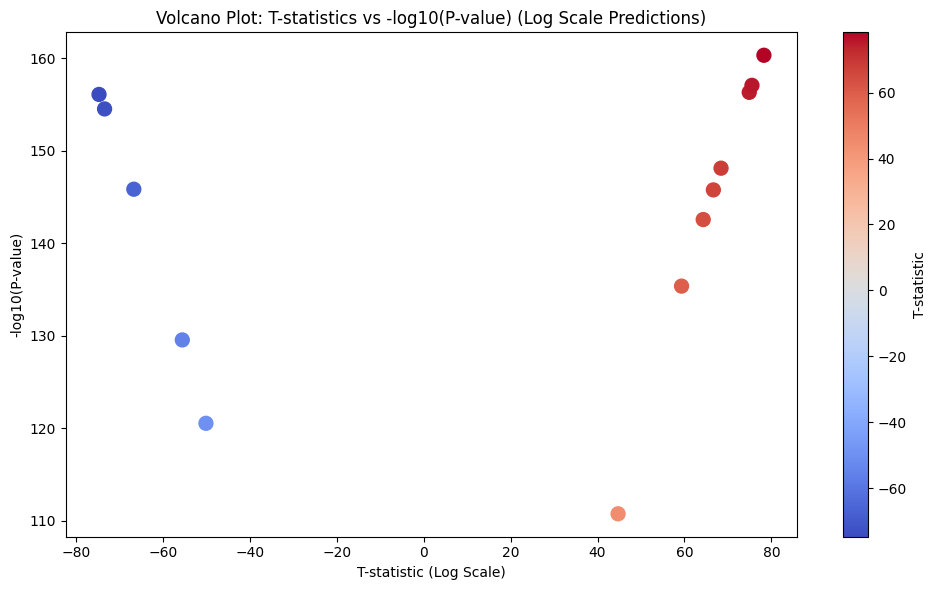

In [ ]:
# Volcano plot (T-statistics vs -log10(P-values))
log_p_values = -np.log10(p_value)
plt.figure(figsize=(10, 6))
plt.scatter(t_stat, log_p_values, c=t_stat, cmap='coolwarm', s=100)
labels = ['{}'.format(i) for i in range(13)]
plt.title('Volcano Plot: T-statistics vs -log10(P-value) (Log Scale Predictions)')
plt.xlabel('T-statistic (Log Scale)')
plt.ylabel('-log10(P-value)')
plt.colorbar(label='T-statistic')
plt.tight_layout()
plt.show()

In [ ]:
[(i, tissues[i]) for i in range(len(tissues)) if 'tine' in tissues[i]]

[(45, 'Small_Intestine_Terminal_Ileum'),
 (193, 'Fetal_Intestine_Large'),
 (194, 'Fetal_Intestine_Small'),
 (205, 'Small_Intestine')]

In [ ]:
tissues

['Adipose_Subcutaneous',
 'Adipose_Visceral_Omentum',
 'Adrenal_Gland',
 'Artery_Aorta',
 'Artery_Coronary',
 'Artery_Tibial',
 'Bladder',
 'Brain_Amygdala',
 'Brain_Anterior_cingulate_cortex_BA24',
 'Brain_Caudate_basal_ganglia',
 'Brain_Cerebellar_Hemisphere',
 'Brain_Cerebellum',
 'Brain_Cortex',
 'Brain_Frontal_Cortex_BA9',
 'Brain_Hippocampus',
 'Brain_Hypothalamus',
 'Brain_Nucleus_accumbens_basal_ganglia',
 'Brain_Putamen_basal_ganglia',
 'Brain_Spinal_cord_cervical_c1',
 'Brain_Substantia_nigra',
 'Breast_Mammary_Tissue',
 'Cells_EBV-transformed_lymphocytes',
 'Cells_Transformed_fibroblasts',
 'Cervix_Ectocervix',
 'Cervix_Endocervix',
 'Colon_Sigmoid',
 'Colon_Transverse',
 'Esophagus_Gastroesophageal_Junction',
 'Esophagus_Mucosa',
 'Esophagus_Muscularis',
 'Fallopian_Tube',
 'Heart_Atrial_Appendage',
 'Heart_Left_Ventricle',
 'Kidney_Cortex',
 'Liver',
 'Lung',
 'Minor_Salivary_Gland',
 'Muscle_Skeletal',
 'Nerve_Tibial',
 'Ovary',
 'Pancreas',
 'Pituitary',
 'Prostate',
 'S

In [ ]:
num_variants = None
all_diffs = []
for shift in range(-800, 801, 200):
  refseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/crohns_seqs/refseqs_human.shift_" + str(shift)
  altseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/crohns_seqs/altseqs_human.shift_" + str(shift)

  refseqs  = extract_seqs_from_pickle(refseqs_filepath)
  altseqs  = extract_seqs_from_pickle(altseqs_filepath)
  # get gene expression value differences
  ref_tokenized = tokenizer(refseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
  ref_input_ids = ref_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
  ref_attention_mask = (ref_input_ids != tokenizer.pad_token_id).long().to(device)
  alt_tokenized = tokenizer(altseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
  alt_input_ids = alt_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
  alt_attention_mask = (alt_input_ids != tokenizer.pad_token_id).long().to(device)
  # get model predictons for both
  ref_preds = model(ref_input_ids, ref_attention_mask).float()
  alt_preds = model(alt_input_ids, alt_attention_mask).float()
  diff = alt_preds - ref_preds
  if num_variants is None:
    num_variants = len(diff)
  all_diffs.append(diff.cpu().detach().numpy())


In [ ]:
# Convert list of arrays to 2D matrix: (num_variants x num_shifts)
shift_values = list(range(-800, 801, 200))
diff_matrix = np.stack(np.mean(np.abs(all_diffs), axis=-1))
df = pd.DataFrame(diff_matrix.T, columns=shift_values)

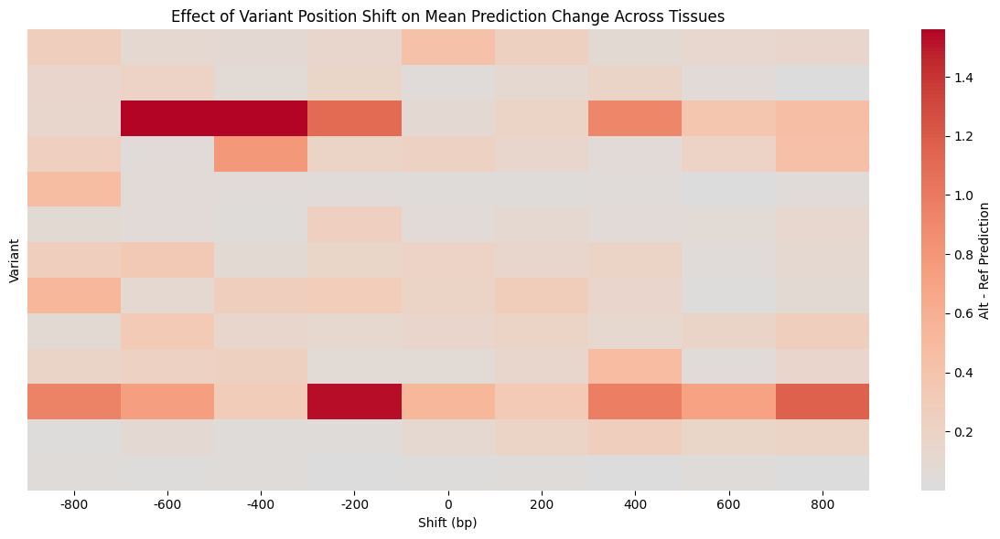

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(df, xticklabels=shift_values, yticklabels=False, cmap="coolwarm", center=0,
            cbar_kws={'label': 'Alt - Ref Prediction'})
plt.xlabel("Shift (bp)")
plt.ylabel("Variant")
plt.title("Effect of Variant Position Shift on Mean Prediction Change Across Tissues")
plt.tight_layout()
plt.show()

In [ ]:
small_intestine_diff = np.array(all_diffs)[:, :, 205]

In [ ]:
np.array(all_diffs).shape

(9, 13, 218)

In [ ]:
diff_matrix = np.stack(small_intestine_diff, axis=-1)
df = pd.DataFrame(diff_matrix, columns=shift_values)

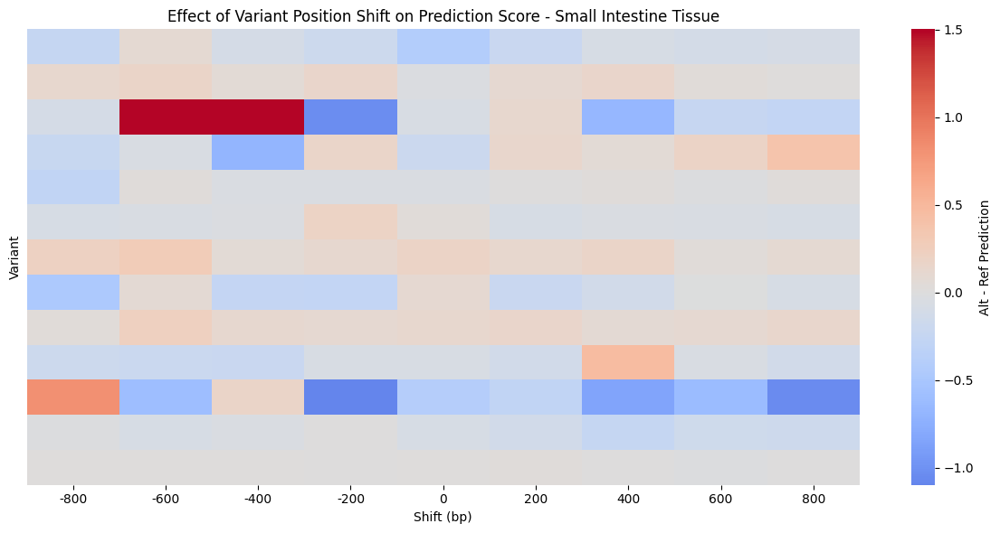

In [ ]:
plt.figure(figsize=(12, 6))
sns.heatmap(df, xticklabels=shift_values, yticklabels=False, cmap="coolwarm", center=0,
            cbar_kws={'label': 'Alt - Ref Prediction'})
plt.xlabel("Shift (bp)")
plt.ylabel("Variant")
plt.title("Effect of Variant Position Shift on Prediction Score - Small Intestine Tissue")
plt.tight_layout()
plt.show()

## UMAP of ref and alt sequences

In [ ]:
refseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/refseqs_human.shift_0"
altseqs_filepath = "/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/altseqs_human.shift_0"

refseqs  = extract_seqs_from_pickle(refseqs_filepath)
altseqs  = extract_seqs_from_pickle(altseqs_filepath)
# get gene expression value differences
ref_tokenized = tokenizer(refseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
ref_input_ids = ref_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
ref_attention_mask = (ref_input_ids != tokenizer.pad_token_id).long().to(device)
alt_tokenized = tokenizer(altseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
alt_input_ids = alt_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
alt_attention_mask = (alt_input_ids != tokenizer.pad_token_id).long().to(device)
# get model predictons for both
# Get embeddings from model (not final logits)
ref_vecs = model(ref_input_ids, ref_attention_mask).cpu().detach().numpy()
alt_vecs = model(alt_input_ids, alt_attention_mask).cpu().detach().numpy()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


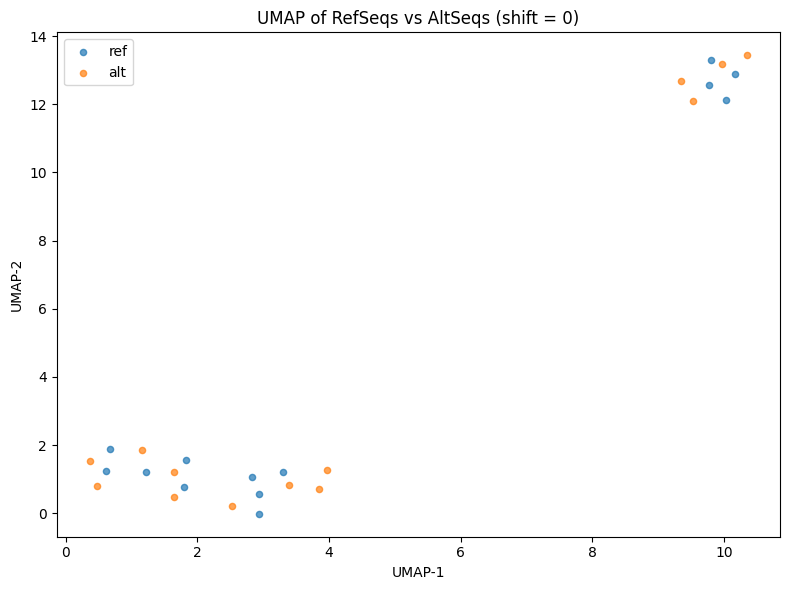

In [ ]:
# UMAP embedding of predictions
import numpy as np
import umap
import matplotlib.pyplot as plt

X = np.concatenate([ref_vecs, alt_vecs], axis=0)
labels = ['ref'] * len(ref_vecs) + ['alt'] * len(alt_vecs)

# Run UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine')
embedding = reducer.fit_transform(X)  # shape: (n_samples, 2)

# Plot
plt.figure(figsize=(8, 6))
for label in ['ref', 'alt']:
    idx = np.array(labels) == label
    plt.scatter(embedding[idx, 0], embedding[idx, 1], label=label, alpha=0.7, s=20)

plt.legend()
plt.title(f"UMAP of RefSeqs vs AltSeqs (shift = 0)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.tight_layout()
plt.show()

## Heatmap of Variant Effect Across Tissues

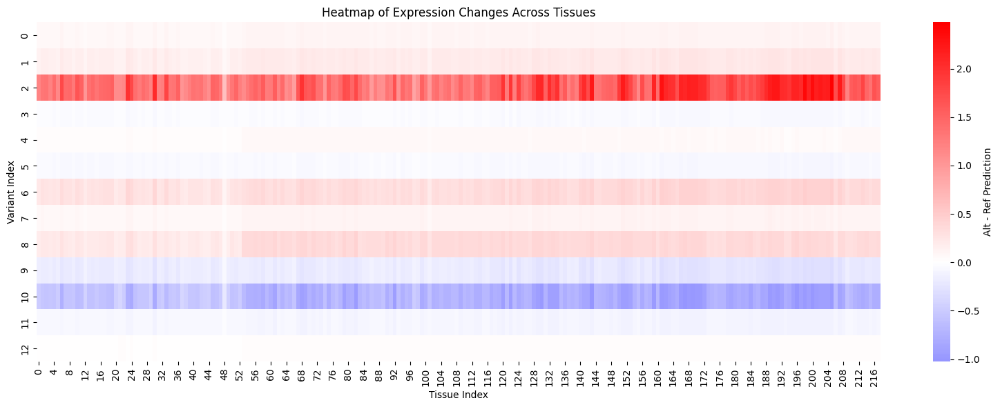

In [ ]:
diff_0_np = all_diffs[1]
plt.figure(figsize=(16, 6))  # Adjust size as needed
sns.heatmap(diff_0_np, cmap='bwr', center=0, cbar_kws={'label': 'Alt - Ref Prediction'})
plt.xlabel("Tissue Index")
plt.ylabel("Variant Index")
plt.title("Heatmap of Expression Changes Across Tissues")
plt.tight_layout()
plt.show()

In [ ]:
print(len(refseqs[3]))
print(len(altseqs[3]))
count = 0
for i in range(len(refseqs[4])):
  if refseqs[4][i] != altseqs[4][i]:
    count += 1
print(count)

2100
2100
1


# Create Figures for Diseases

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import umap

In [ ]:
import os
from os import path


In [ ]:
def variant_tissues_heatmap(diff_np, shift, disease_folder):
  plt.figure(figsize=(16, 6))  # Adjust size as needed
  sns.heatmap(diff_np, cmap='bwr', center=0, cbar_kws={'label': 'Alt - Ref Prediction'})
  plt.xlabel("Tissue Index")
  plt.ylabel("Variant Index")
  plt.title(f"Heatmap of Expression Changes Across Tissues (shift = {shift})")
  plt.tight_layout()
  plt.savefig(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{disease_folder}/shift_{str(shift)}/variant_tissue_heatmap_shift.png')

In [ ]:
def seqs_UMAP(ref_vecs, alt_vecs, shift, disease_folder):
  X = np.concatenate([ref_vecs, alt_vecs], axis=0)
  labels = ['ref'] * len(ref_vecs) + ['alt'] * len(alt_vecs)

  # Run UMAP
  reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine')
  embedding = reducer.fit_transform(X)  # shape: (n_samples, 2)

  # Plot
  plt.figure(figsize=(8, 6))
  for label in ['ref', 'alt']:
      idx = np.array(labels) == label
      plt.scatter(embedding[idx, 0], embedding[idx, 1], label=label, alpha=0.7, s=20)

  plt.legend()
  plt.title(f"UMAP of RefSeqs vs AltSeqs (shift = {shift})")
  plt.xlabel("UMAP-1")
  plt.ylabel("UMAP-2")
  plt.tight_layout()
  plt.savefig(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{disease_folder}/shift_{str(shift)}/seqs_UMAP.png')


In [ ]:
def variant_shift_heatmap_mean(all_diffs, disease):
  shift_values = list(range(-800, 801, 200))
  diff_matrix = np.stack(np.mean(np.abs(all_diffs), axis=-1))
  df = pd.DataFrame(diff_matrix.T, columns=shift_values)
  plt.figure(figsize=(12, 6))
  sns.heatmap(df, xticklabels=shift_values, yticklabels=False, cmap="coolwarm", center=0,
              cbar_kws={'label': 'Alt - Ref Prediction'})
  plt.xlabel("Shift (bp)")
  plt.ylabel("Variant")
  plt.title("Effect of Variant Position Shift on Mean Prediction Change Across Tissues")
  plt.tight_layout()
  plt.savefig(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{disease}/prediction_change_mean_shift.png')

In [ ]:
def variant_shift_heatmap_tissue_specific(all_diffs, tissue_ind, tissue):
  tissue_diff = np.array(all_diffs)[:, :, tissue_ind]
  diff_matrix = np.stack(tissue_diff, axis=-1)
  df = pd.DataFrame(diff_matrix, columns=shift_values)
  plt.figure(figsize=(12, 6))
  sns.heatmap(df, xticklabels=shift_values, yticklabels=False, cmap="coolwarm", center=0,
              cbar_kws={'label': 'Alt - Ref Prediction'})
  plt.xlabel("Shift (bp)")
  plt.ylabel("Variant")
  plt.title(f"Effect of Variant Position Shift on Prediction Score {tissue}")
  plt.tight_layout()
  # plt.show()

In [ ]:
def volcano_plot(ref_preds, alt_preds, shift, disease, num_variants):
  # Initialize lists to store t-statistics and p-values for each variant
  t_stat = np.zeros((num_variants,))  # Shape (num_variants,), t-statistic for each variant
  p_value = np.zeros((num_variants,))  # Shape (num_variants,), p-value for each variant

  # Loop through each variant (index 0 to num_variants)
  for variant_idx in range(num_variants):
      # Extract reference and alternative predictions for the current variant across all 218 tissues
      ref_pred = ref_preds[variant_idx, :].cpu().detach().numpy()  # Ref predictions for the current variant
      alt_pred = alt_preds[variant_idx, :].cpu().detach().numpy()  # Alt predictions for the current variant

      # Perform a paired t-test between ref_pred and alt_pred for the current variant across all tissues
      t_stat[variant_idx], p_value[variant_idx] = ttest_rel(ref_pred, alt_pred)
  log_p_values = -np.log10(p_value)
  plt.figure(figsize=(10, 6))
  plt.scatter(t_stat, log_p_values, c=t_stat, cmap='coolwarm', s=100)
  labels = ['{}'.format(i) for i in range(num_variants)]
  plt.title('Volcano Plot: T-statistics vs -log10(P-value) (Log Scale Predictions)')
  plt.xlabel('T-statistic (Log Scale)')
  plt.ylabel('-log10(P-value)')
  plt.colorbar(label='T-statistic')
  plt.tight_layout()
  plt.savefig(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{disease}/shift_{str(shift)}/volcano_plot_{str(shift)}.png')
  # plt.show()

In [ ]:
def variant_scatter(diff, variant_num, disease, shift):
  plt.figure(figsize=(10, 6))
  variant_exp_diff = diff[variant_num, :].cpu().detach().numpy()
  plt.scatter(range(218), variant_exp_diff)  # For the first variant
  plt.xlabel("Tissues")
  plt.ylabel(f"Expression Difference (Alt - Ref) for Variant {variant_num}")
  plt.title(f"Expression Difference for Variant {variant_num} Across 218 Tissues")
  plt.savefig(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{disease}/shift_{str(shift)}/variant_scatter_{variant_num}.png')
  # plt.show()

crohns_seqs


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
<ipython-input-106-3f5bc8cd92da>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packa

Num variants 13
coronary_seqs


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
<ipython-input-91-00421dfce54f>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packag

Num variants 15
diabetes_seqs


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
<ipython-input-106-3f5bc8cd92da>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packa

Num variants 32
schizophrenia_seqs


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
<ipython-input-106-3f5bc8cd92da>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packa

Num variants 36


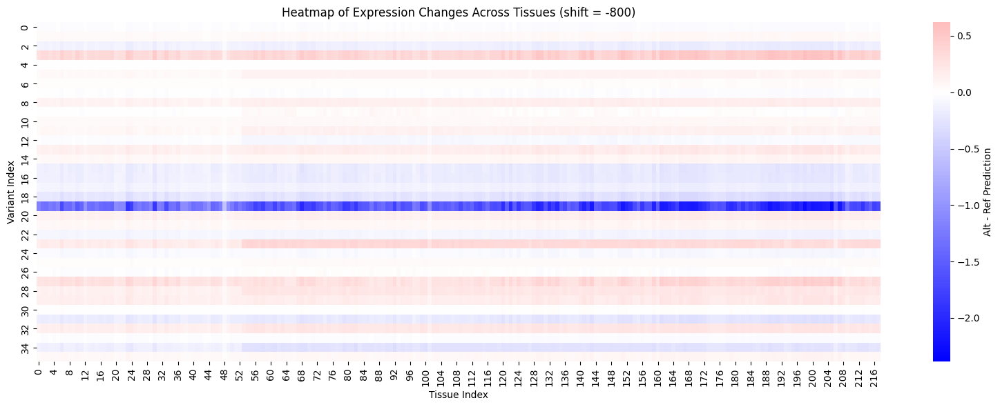

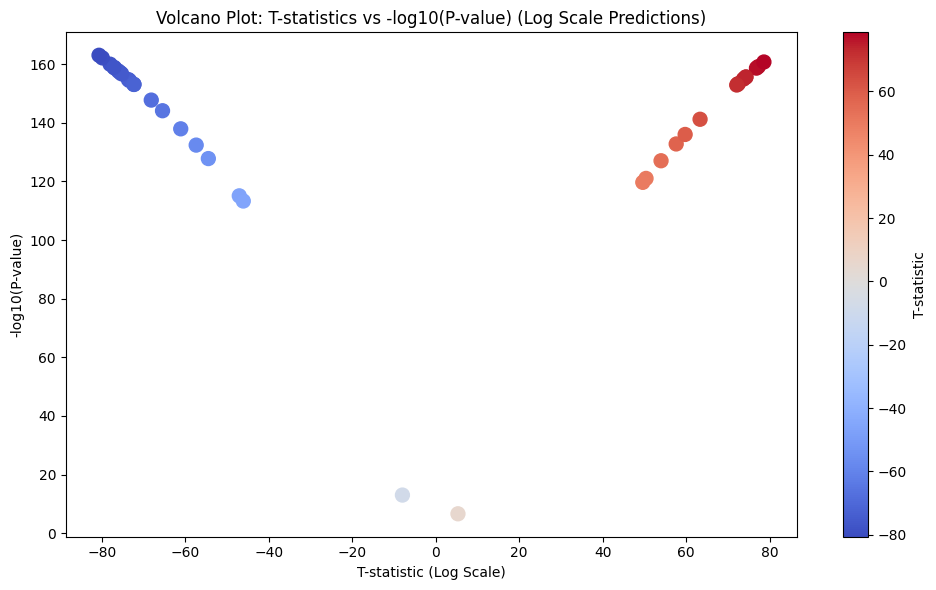

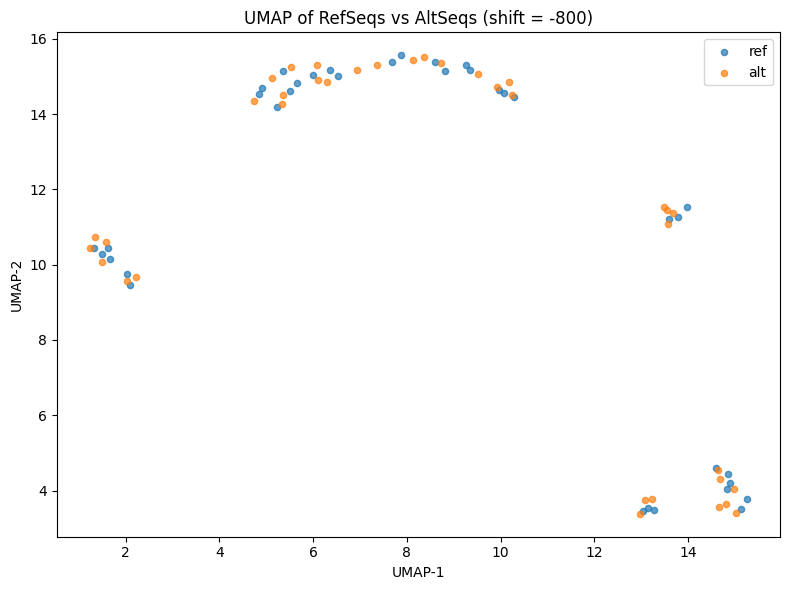

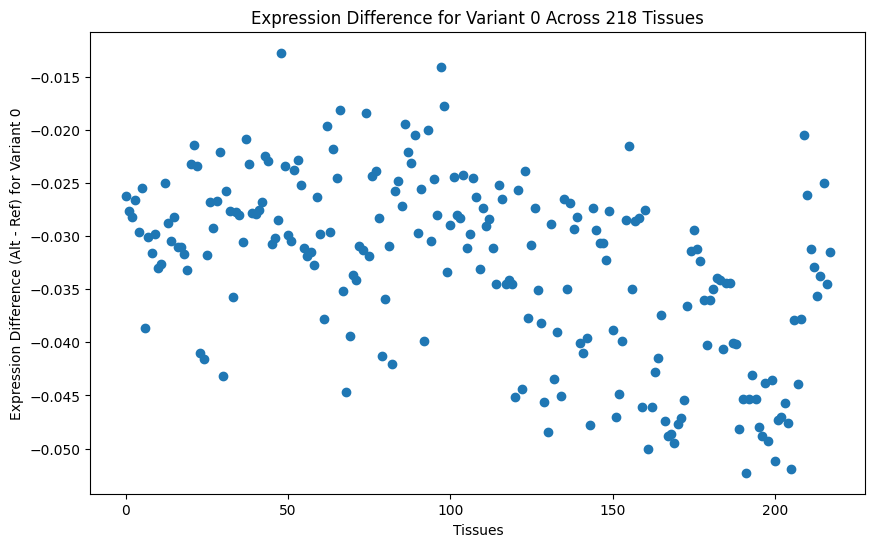

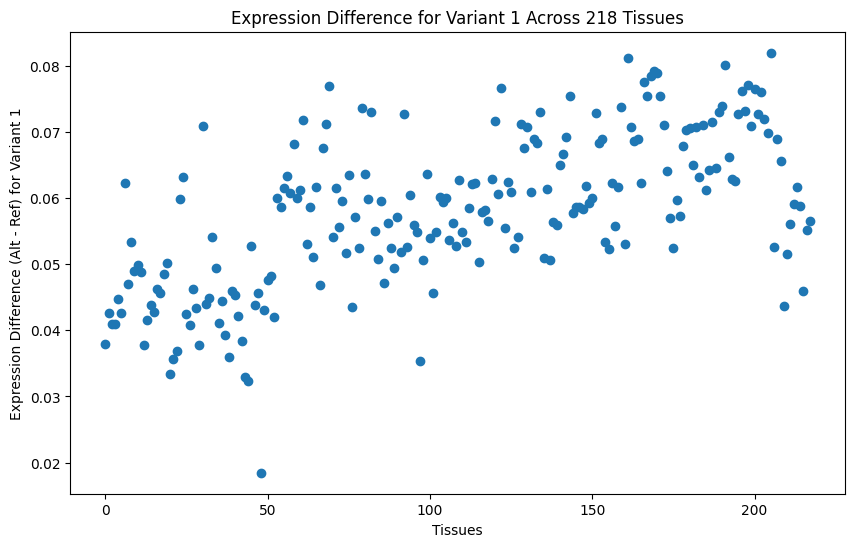

...

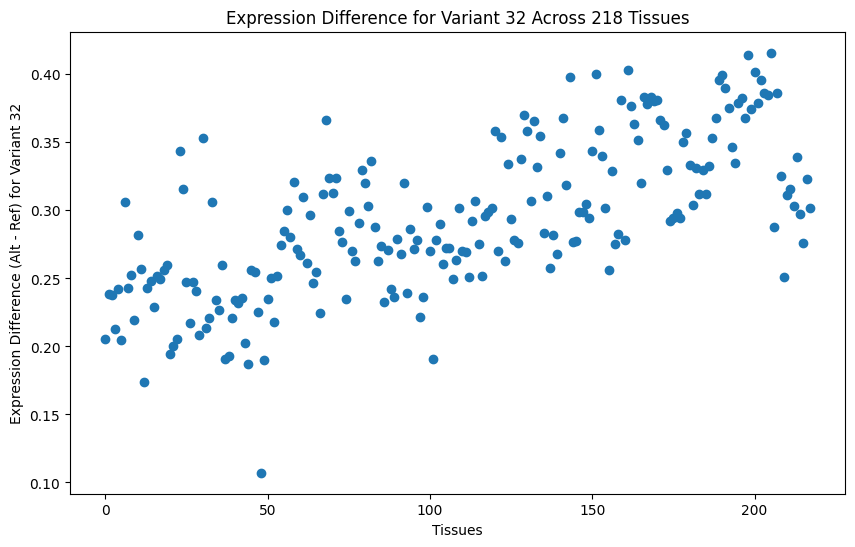

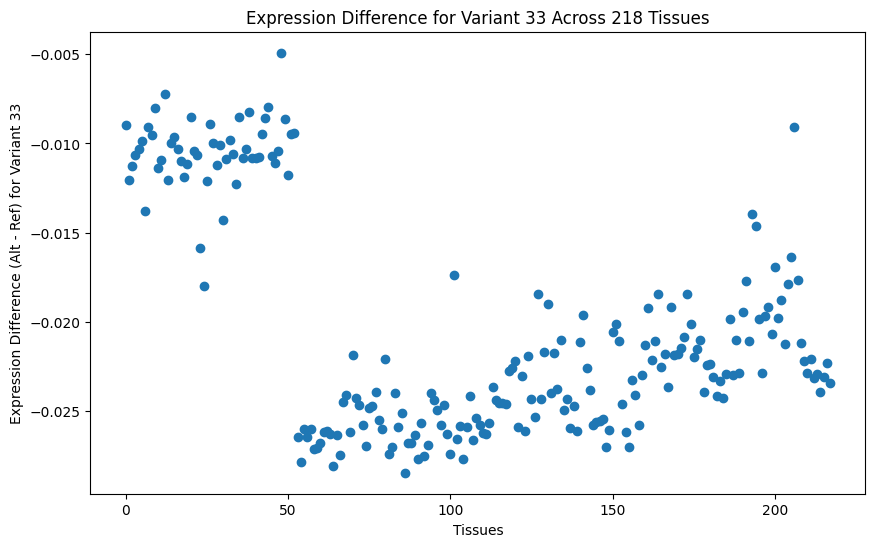

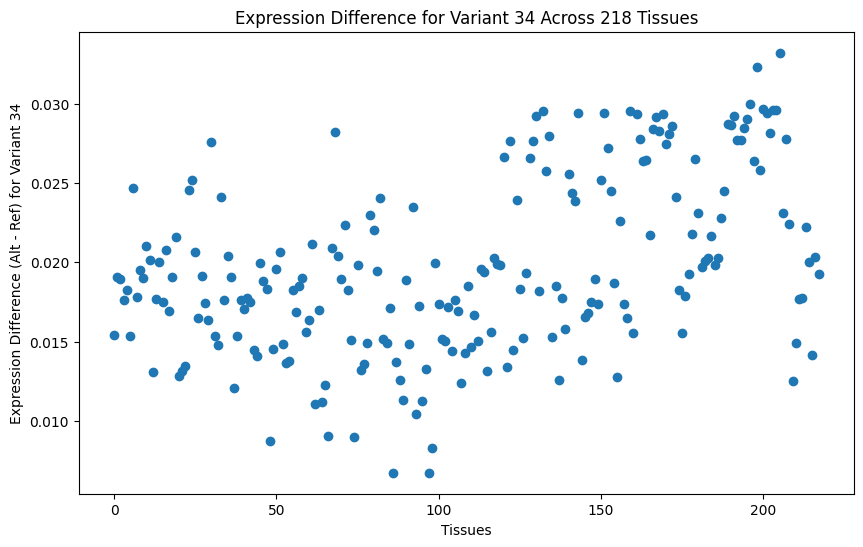

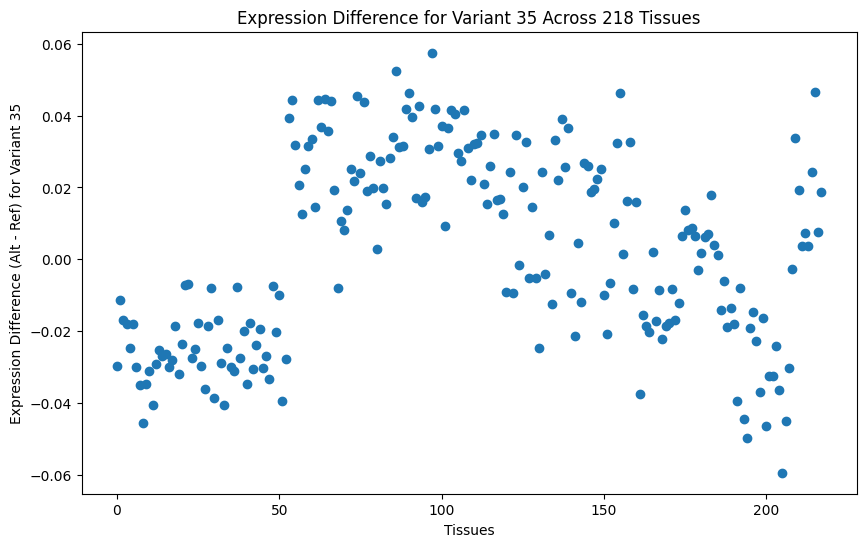

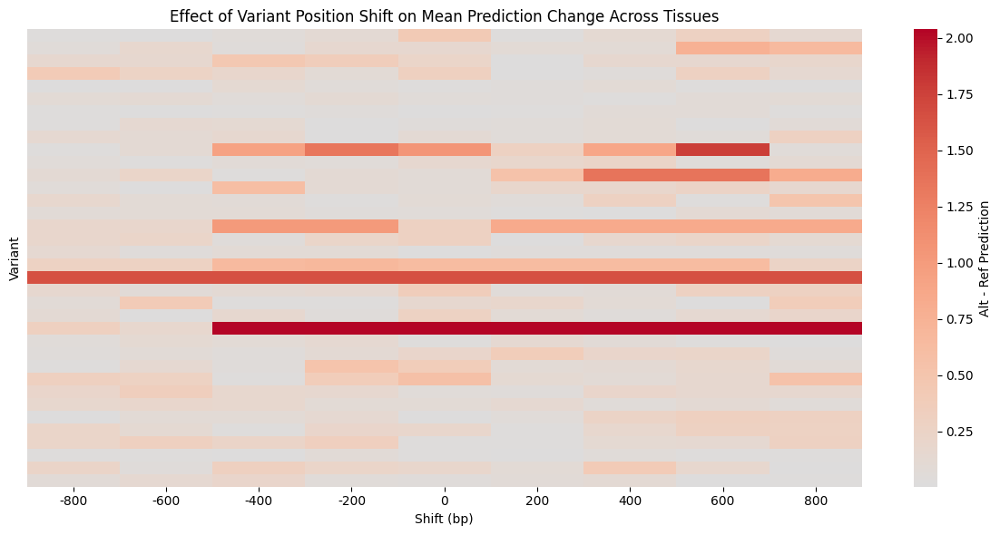

In [ ]:
disease_seqs = ['crohns_seqs', 'coronary_seqs', 'diabetes_seqs', 'schizophrenia_seqs']
figure_folder = ['crohns', 'coronary_heart', 'diabetes', 'schizophrenia']
for i, folder in enumerate(disease_seqs):
  print(folder)
  plt.close("all")
  num_variants = None
  all_diffs = []
  for shift in range(-800, 801, 200):
    if path.exists(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{figure_folder[i]}/shift_{str(shift)}/') == False:
      os.mkdir(f'/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/Figures/variant_effect_figs/{figure_folder[i]}/shift_{str(shift)}/')
    refseqs_filepath = f"/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/{folder}/refseqs_human.shift_" + str(shift)
    altseqs_filepath = f"/content/drive/MyDrive/CSCI/CSCI2952G/Final Project/data/vcf/{folder}/altseqs_human.shift_" + str(shift)
    refseqs  = extract_seqs_from_pickle(refseqs_filepath)
    altseqs  = extract_seqs_from_pickle(altseqs_filepath)
    # get gene expression value differences
    ref_tokenized = tokenizer(refseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
    ref_input_ids = ref_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
    ref_attention_mask = (ref_input_ids != tokenizer.pad_token_id).long().to(device)
    alt_tokenized = tokenizer(altseqs, return_tensors="pt", padding="max_length", max_length=max_length, truncation=True)
    alt_input_ids = alt_tokenized["input_ids"].squeeze(0).to(device)  # (seq_len,)
    alt_attention_mask = (alt_input_ids != tokenizer.pad_token_id).long().to(device)
    # get model predictons for both
    ref_preds = model(ref_input_ids, ref_attention_mask).float()
    alt_preds = model(alt_input_ids, alt_attention_mask).float()
    diff = alt_preds - ref_preds
    if num_variants is None:
      num_variants = len(diff)
    all_diffs.append(diff.cpu().detach().numpy())
    variant_tissues_heatmap(diff.cpu().detach().numpy(), shift, figure_folder[i])
    volcano_plot(ref_preds, alt_preds, shift, figure_folder[i], num_variants)
    ref_vecs = model(ref_input_ids, ref_attention_mask).cpu().detach().numpy()
    alt_vecs = model(alt_input_ids, alt_attention_mask).cpu().detach().numpy()
    seqs_UMAP(ref_vecs, alt_vecs, shift, figure_folder[i])
    for variant_num in range(num_variants):
      variant_scatter(diff, variant_num, figure_folder[i], shift)
  print("Num variants", num_variants)
  variant_shift_heatmap_mean(all_diffs, figure_folder[i])
